In [1]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
import ipywidgets as widgets
from ipywidgets import interact, fixed
from IPython.display import display, clear_output
from plotly.subplots import make_subplots
from math import *

--- 


## This main code is part of the paper "Analysis of Socioeconomic Indicators in Brazil and the Americas," by L.C. Rossato, S. Gonçalves, and J.R. Iglesias.

--- 

 For better visualization, use Jupyter.

---

#### Used colors in paper for Brazil macrorregions:  
HEX Colors = ['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD'] ; Respectively [Midwest, Southeast, North, Northeast  and South]

#### List of colors for different datasets:
['green', 'blue', 'red', 'purple', 'orange', 'brown'] <=> [Brazil, Chile, Peru, Mexico , El Salvador and USA]

---
---
---

#### Readme:

This notebook was implemented for easily visualyzing the graphical analysis possibilities. For this purpose,  interactive menus and buttons were added. Furthermore, there is example base graphical  code, which can be freely used for others applications and analyses.

In the paper, there are only plots about HDI vs. population. However, in this notebook, there are more variables that can be compared. For instance, HDI (per cities) component of income vs. Population.



---
---
---

In [2]:
# Reading CSV files for different countries data
df_ElSalvador = pd.read_csv('df_ElSalvador.csv')
df_Chile      = pd.read_csv('df_Chile.csv')
df_Mexico     = pd.read_csv('df_Mexico.csv')
df_Peru       = pd.read_csv('df_Peru.csv')
df_USA        = pd.read_csv('df_USA.csv')
df_Brazil     = pd.read_csv('df_Brazil.csv')

# Function to create an interactive scatter plot
def plot_interact(axis_x,axis_y, cor, hovername):
    fig = px.scatter(data_frame=df, x=axis_x, y=axis_y, marginal_x="box", marginal_y="box", 
                     template="simple_white", hover_name= hovername, log_x = True, log_y = True,
                     color = cor, height=500)
    fig.show()


# Brazil

In [3]:
# Assigning the dataframe to be used
df = df_Brazil

# Creating dropdown widgets for selecting x and y axes
axis_x = widgets.Dropdown(options=df.columns, value='Total_Pop_Absol', description='x axis')
axis_y = widgets.Dropdown(options=df.columns, value='IDHM_2010', description='y axis')

# Interact function to create an interactive plot
interact(plot_interact, axis_x=axis_x, axis_y=axis_y, cor=['Macroregioes', 'UF'], hovername='Municipio')

interactive(children=(Dropdown(description='x axis', index=5, options=('Municipio', 'IDHM_2010', 'IDHM_Renda_2…

<function __main__.plot_interact(axis_x, axis_y, cor, hovername)>

# Chile

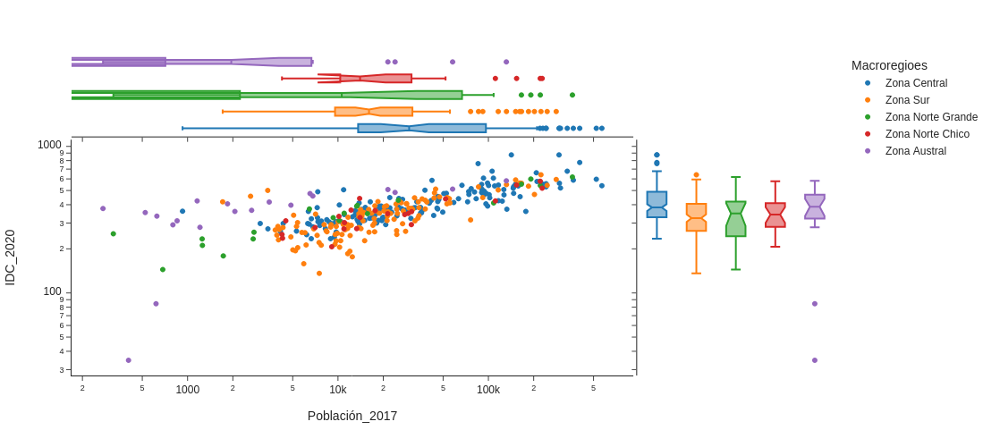

interactive(children=(Dropdown(description='eixo x', index=8, options=('REGIÓN', 'COMUNA', 'BIENESTAR', 'ECONO…

<function __main__.plot_interact(axis_x, axis_y, cor, hovername)>

In [13]:
df=df_Chile
eixo_x = widgets.Dropdown(options=df.columns, value='Población_2017', description='eixo x')
eixo_y = widgets.Dropdown(options=df.columns, value='IDC_2020', description='eixo y')

interact(plot_interact, axis_x=eixo_x, axis_y=eixo_y,
         cor=['Macroregioes', 'REGIÓN'], hovername='COMUNA')

# Peru

In [14]:
df = df_Peru
eixo_x = widgets.Dropdown(options=df.columns, value='Pop_2017', description='eixo x')
eixo_y = widgets.Dropdown(options=df.columns, value='HDI_2017', description='eixo y')
interact(plot_interact, axis_x=eixo_x, axis_y=eixo_y,
         cor=['Macroregiao', 'Macroregioes_Topografica'], hovername='City')

interactive(children=(Dropdown(description='eixo x', index=9, options=('Code', 'State', 'City', 'Pop_2003', 'P…

<function __main__.plot_interact(axis_x, axis_y, cor, hovername)>

# Mexico

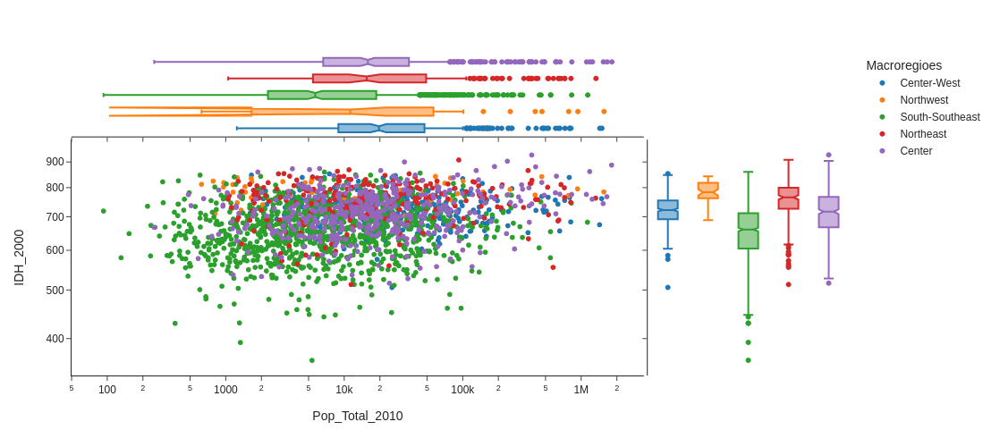

interactive(children=(Dropdown(description='eixo x', index=14, options=('Clave', 'Comuna', 'Mortalidad_infanti…

<function __main__.plot_interact(axis_x, axis_y, cor, hovername)>

In [15]:
df = df_Mexico
eixo_x = widgets.Dropdown(options=df.columns, value='Pop_Total_2010', description='eixo x')
eixo_y = widgets.Dropdown(options=df.columns, value='IDH_2000', description='eixo y')

interact(plot_interact, axis_x=eixo_x, axis_y=eixo_y,
         cor=['Macroregioes', 'State'], hovername='Comuna')

# El Salvador

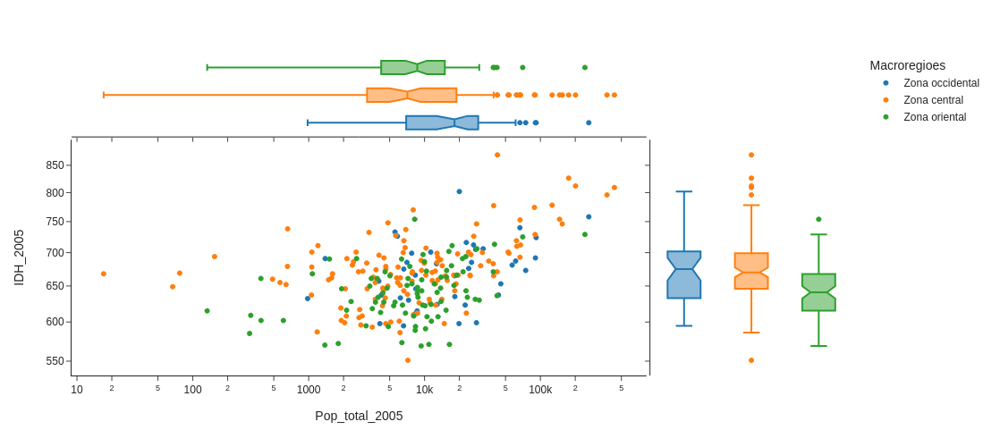

interactive(children=(Dropdown(description='eixo x', index=12, options=('Comuna', 'Esperanza_vida', 'Tasa_matr…

<function __main__.plot_interact(axis_x, axis_y, cor, hovername)>

In [16]:
df = df_ElSalvador[ ~ df_ElSalvador.IDH_2005.isna() == True]
eixo_x = widgets.Dropdown(options=df.columns, value='Pop_total_2005', description='eixo x')
eixo_y = widgets.Dropdown(options=df.columns, value='IDH_2005', description='eixo y')

interact(plot_interact, axis_x=eixo_x, axis_y=eixo_y,
         cor=['Macroregioes', 'State'], hovername='Comuna')

# USA: Per County

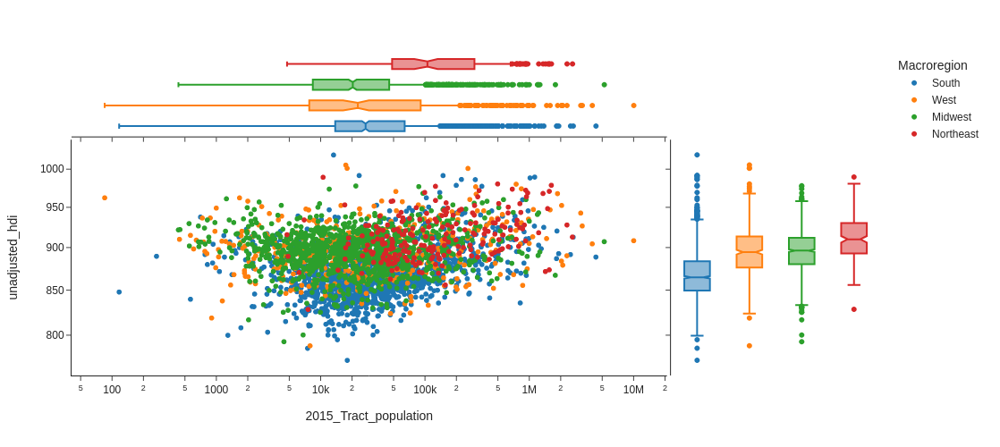

interactive(children=(Dropdown(description='x axis', index=1, options=('County_States', '2015_Tract_population…

<function __main__.plot_interact(axis_x, axis_y, cor, hovername)>

In [17]:
# Create new column "County_+_States"
df_USA['County_States'] = df_USA['County'] + ', ' + df_USA['State']

# Aggregating data for each county in the USA dataframe
df_aggregated = df_USA.groupby(['County_States']).agg({
    '2015_Tract_population': 'sum',
    'adjusted_hdi': 'mean',
    'unadjusted_hdi': 'mean',
    'unadjusted_income_index': 'mean',    
    'adjusted_income_index': 'mean',
    'expect_edu_index': 'mean',
    'mean_edu_index': 'mean',
    'final_edu_index': 'mean',
    'le_index': 'mean',
    'Macroregion': 'first',
}).reset_index()

# Filtering out rows where unadjusted_hdi is not NaN
df_USA_PerCounty = df_aggregated[~df_aggregated['unadjusted_hdi'].isna() == True]

# Assigning the filtered dataframe to be used
df = df_USA_PerCounty

# Creating dropdown widgets for selecting x and y axes
axis_x = widgets.Dropdown(options=df.columns, value='2015_Tract_population', description='x axis')
axis_y = widgets.Dropdown(options=df.columns, value='unadjusted_hdi', description='y axis')

# Interact function to create an interactive plot
interact(plot_interact, axis_x=axis_x, axis_y=axis_y, cor=['Macroregion', 'State'], hovername='County_States')

# Comparison between all countries

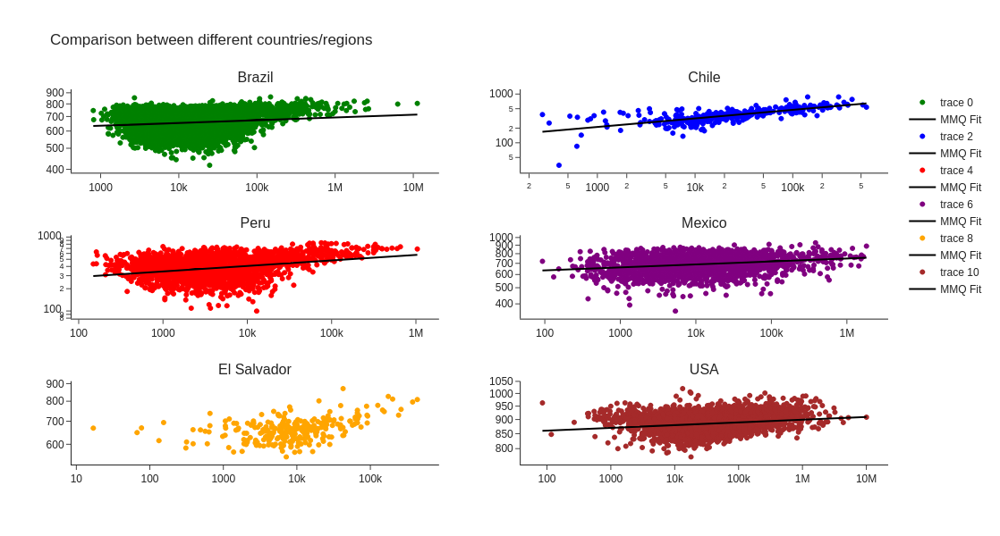

In [33]:
# Importing necessary libraries
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# Function to generate scatter plot with trendline
def generate_subplot(df, axis_x, axis_y, hovername, color):
    log_x = np.log10(df[axis_x])
    log_y = np.log10(df[axis_y])

    model = sm.OLS(log_y, sm.add_constant(log_x)).fit()
    predicted = model.predict(sm.add_constant(log_x))
    
    scatter = go.Scatter(x=df[axis_x], y=df[axis_y], mode='markers', 
                         hovertext=df[hovername], marker=dict(color=color))
    
    line = go.Scatter(x=df[axis_x], y=10**predicted, mode='lines',
                      line=dict(color='black'), name="MMQ Fit")

    return scatter, line

# List of colors for different datasets
colors_list = ['green', 'blue', 'red', 'purple', 'orange', 'brown']

# Dictionary to store DataFrames and respective options
datasets = {
    'Brazil': {'df': df_Brazil, 'x': 'Total_Pop_Absol', 'y': 'IDHM_2010', 'cor': 'Macroregioes', 'hover': 'Municipio'},
    'Chile': {'df': df_Chile, 'x': 'Población_2017', 'y': 'IDC_2020', 'cor': 'Macroregioes', 'hover': 'COMUNA'},
    'Peru': {'df': df_Peru, 'x': 'Pop_2017', 'y': 'HDI_2017', 'cor': 'Macroregiao', 'hover': 'City'},
    'Mexico': {'df': df_Mexico, 'x': 'Pop_Total_2010', 'y': 'IDH_2000', 'cor': 'Macroregioes', 'hover': 'Comuna'},
    'El Salvador': {'df': df_ElSalvador, 'x': 'Pop_total_2005', 'y': 'IDH_2005', 'cor': 'Macroregioes', 'hover': 'Comuna'},
    'USA': {'df': df_USA_PerCounty, 'x': '2015_Tract_population', 'y': 'unadjusted_hdi', 'cor': 'Macroregion', 'hover': 'County_States'}
}

# Creating subplot grid
fig = make_subplots(rows=3, cols=2, subplot_titles=list(datasets.keys()))

# Initialize row, column, and color index
row, col = 1, 1
color_idx = 0

# Iterate over datasets and add scatter plots with trendlines to subplots
for name, data in datasets.items():
    scatter, line = generate_subplot(data['df'], data['x'], data['y'], data['hover'], colors_list[color_idx])
    fig.add_trace(scatter, row=row, col=col)
    fig.add_trace(line, row=row, col=col)
    col += 1
    if col > 2:
        col = 1
        row += 1
    color_idx += 1

# Update layout and show the plot
fig.update_layout(title_text="Comparison between different countries/regions",
                  template="simple_white", width=800, height=600)
fig.update_xaxes(type="log"); fig.update_yaxes(type="log")
fig.show()

# Save figure as SVG and PNG
# fig.write_image("figure.svg")
# fig.write_image("figure.png", scale=3)  # scale parameter increases resolution


# Binscatter Process

In [25]:
# Function to separate data into linear 'bins'
def separate_bins_by_n_values(n, df, axis_x):
    min_value = df[axis_x].min()
    max_value = df[axis_x].max()
    return [min_value + i * (max_value - min_value) / n for i in range(n + 1)]

# Function to separate data into exponential 'bins'
def separate_bins_by_exponential(n, df, axis_x):
    bins = [df[axis_x].min()]
    for i in range(10*n):
        bins.append(bins[i] * (e**((i+1)/n) / e**(i/n)))
    return bins

# Function to create DataFrame based on 'bins' and calculate the mean of each bin
def create_bins_df(n, df, bin_separation_mode, axis_x, axis_y):
    if bin_separation_mode == 'linear':
        classes = separate_bins_by_n_values(n, df, axis_x)
    elif bin_separation_mode == 'exponential':
        classes = separate_bins_by_exponential(n, df, axis_x)    
    df['bins'] = pd.cut(df[axis_x], bins=classes, include_lowest=True, 
                        labels=['bin_' + str(i) for i in range(len(classes) - 1)])    
    df_bins = df.groupby('bins').agg({axis_x: 'mean', axis_y: 'mean'}).reset_index(drop=True)
    return df_bins

# Function to plot histogram and scatter plots of the 'bins'
def plot_bins_df(df_bins, df, axis_x, axis_y):
    display(pd.DataFrame(df['bins'].value_counts()).sort_index().T.round(2))
    display(df_bins.T.round(2))
    fig = make_subplots(rows=3, cols=1)
    fig.update_layout(title='Analysis ' + axis_y + ' x ' + axis_x + ' by bins',
                      height=1000, width=1000, plot_bgcolor='whitesmoke',
                      bargap=0.1, bargroupgap=0.2)
    fig.add_trace(go.Histogram(x=df.sort_values('bins')['bins'], name='Histogram'), row=1, col=1)
    non_nan_x = ~np.isnan(df_bins[axis_x]);  non_nan_y = ~np.isnan(df_bins[axis_y])   
    for r in [2, 3]:
        fig.add_trace(go.Scatter(x=df_bins[axis_x][non_nan_x], y=df_bins[axis_y][non_nan_y], 
                                 name='Linear Plot'), row=r, col=1)
    fig.update_yaxes(title_text='Counts: number of municipalities in each bin', row=1, col=1)
    fig.update_yaxes(title_text=axis_y + ' mean of bins', row=2, col=1)
    fig.update_xaxes(title_text=axis_x + " mean of bins", type="log", row=3, col=1)
    display(fig)

# Main function to create and plot graphs based on 'bins'
def create_and_plot_bins_graphs(n, df, bin_separation_mode, axis_x, axis_y):
    df_bins = create_bins_df(n, df, bin_separation_mode, axis_x, axis_y)
    plot_bins_df(df_bins, df, axis_x, axis_y)

### Binscatter Brazil 

,bin_0,bin_1,bin_2,bin_3,bin_4,bin_5,bin_6,bin_7,bin_8,bin_9
bins,175,1441,1910,1348,476,144,54,12,4,1


,0,1,2,3,4,5,6,7,8,9
Total_Pop_Absol,1810.66,4006.17,10252.77,25568.73,70504.11,195906.85,495429.24,1401744.33,3504611.75,11253503.0
IDHM_2010,696.90,662.73,642.61,648.16,692.10,737.15,765.50,774.00,784.00,805.0


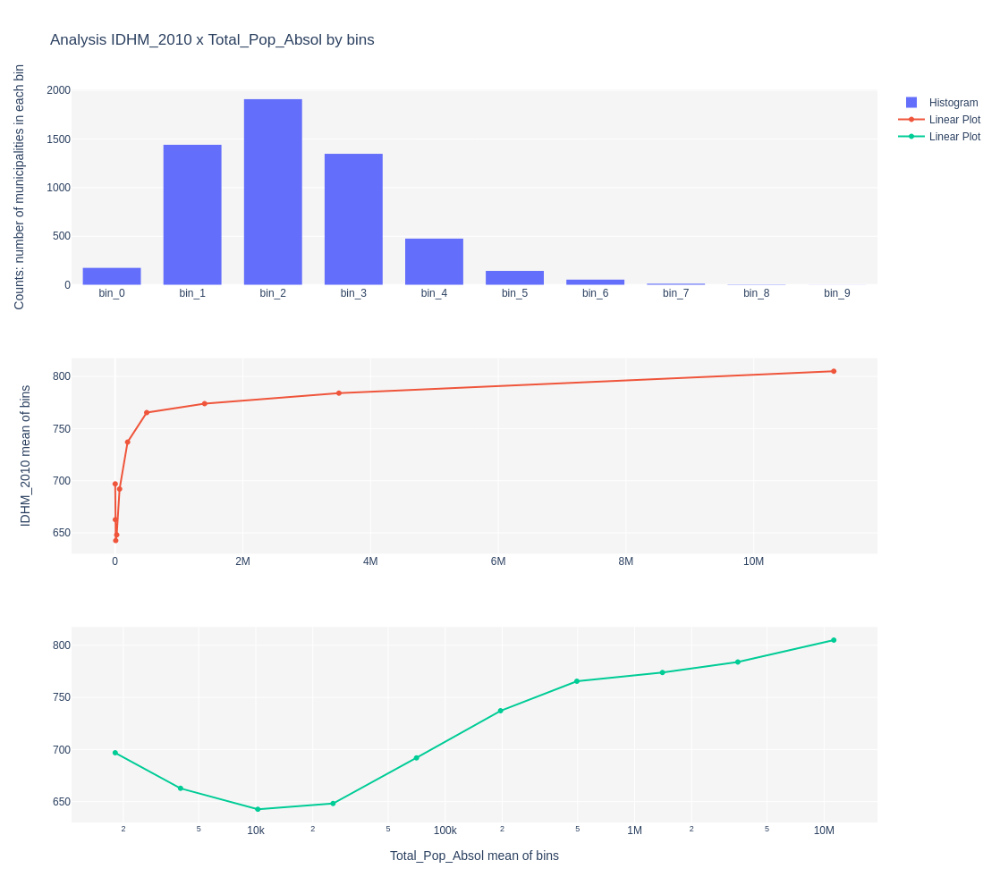

In [26]:
create_and_plot_bins_graphs(n=1, df=df_Brazil, bin_separation_mode='exponential', 
                            axis_x='Total_Pop_Absol', axis_y='IDHM_2010')

### Binscatter Peru

,bin_0,bin_1,bin_2,bin_3,bin_4,bin_5,bin_6,bin_7,bin_8,bin_9
bins,48,287,486,499,318,132,72,27,5,0


,0,1,2,3,4,5,6,7,8,9
Pop_2017,289.42,743.46,1957.21,5048.7,13051.40,35299.73,93527.68,254693.67,652696.8,NaN
HDI_2017,426.40,387.42,363.49,372.4,404.61,527.00,614.73,654.55,704.1,NaN


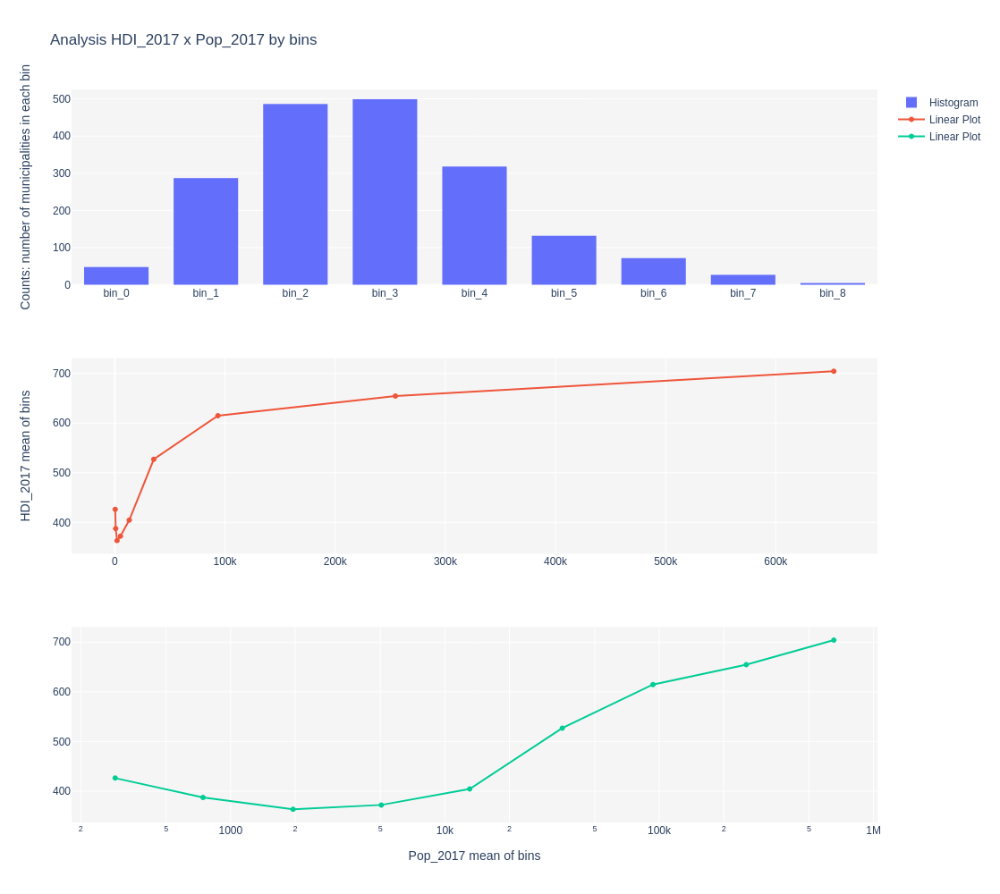

In [27]:
create_and_plot_bins_graphs(n=1, df=df_Peru, bin_separation_mode='exponential', 
                            axis_x='Pop_2017', axis_y='HDI_2017')

### Binscatter Chile

,bin_0,bin_1,bin_2,bin_3,bin_4,bin_5,bin_6,bin_7,bin_8,bin_9
bins,7,10,29,100,99,52,41,7,0,0


,0,1,2,3,4,5,6,7,8,9
Población_2017,492.71,1273.10,4077.34,10241.79,24479.84,72590.00,179475.63,408368.29,NaN,NaN
IDC_2020,226.00,311.61,294.24,302.93,362.29,474.57,545.35,616.69,NaN,NaN


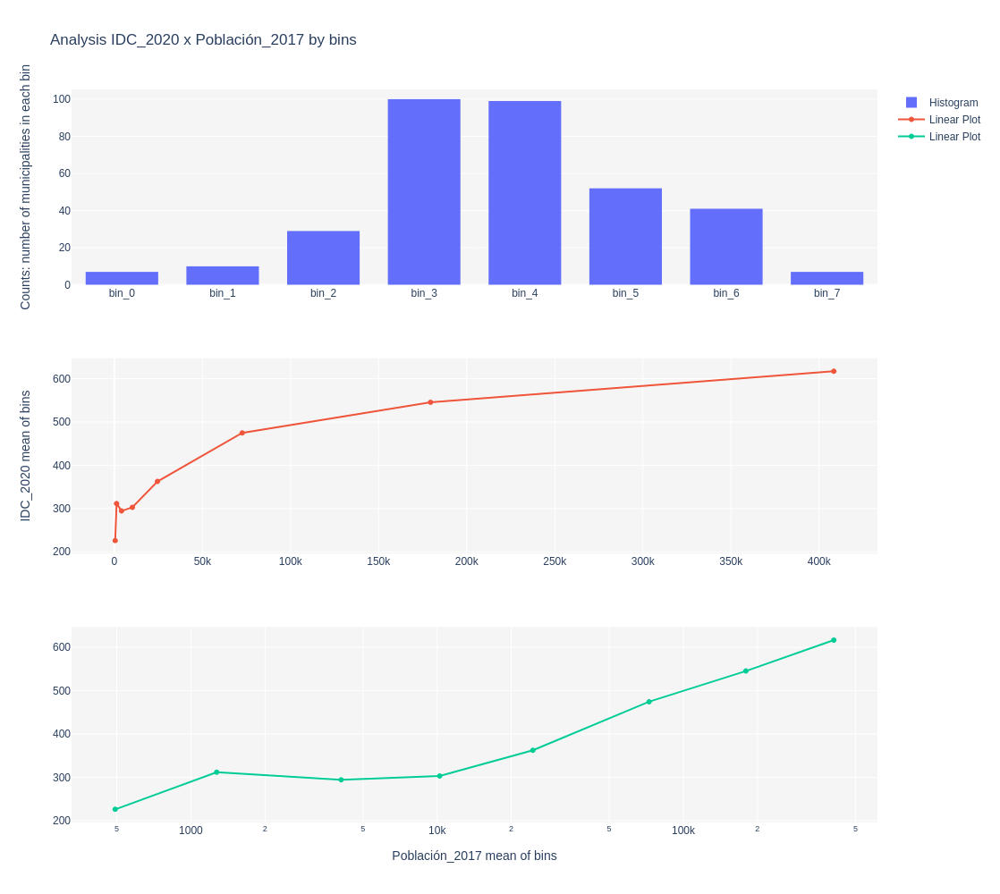

In [28]:
create_and_plot_bins_graphs(n=1, df=df_Chile, bin_separation_mode='exponential', 
                            axis_x='Población_2017', axis_y='IDC_2020')

___

### To plot the binscatter for other countries, just follow the same plotting pattern as shown in the examples (cases, Brazil, Peru, and Chile).


___
___
___


# Route for calculating Binscatter Curve Fitting

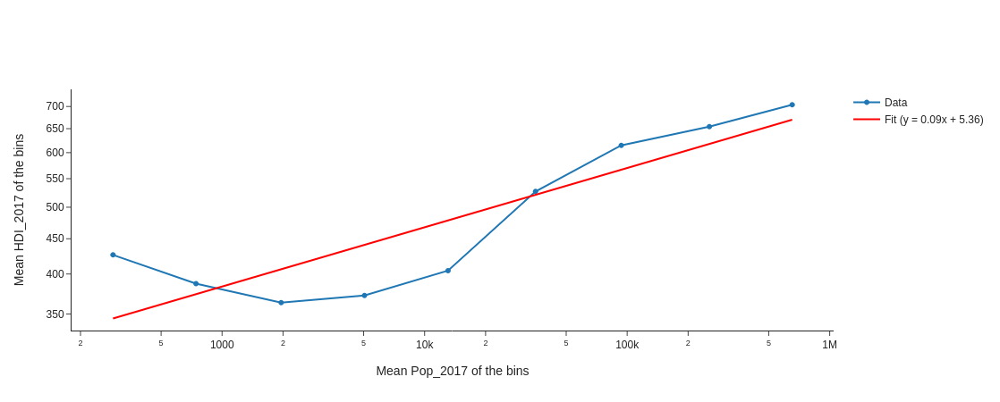

In [29]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.optimize import curve_fit

# Function to separate data into linear 'bins'
def separate_bins_by_n_values(n, df, x_axis):
    min_value = df[x_axis].min()
    max_value = df[x_axis].max()
    return [min_value + i * (max_value - min_value) / n for i in range(n + 1)]

# Function to separate data into exponential 'bins'
def separate_bins_by_exponential(n, df, x_axis):
    bins = [df[x_axis].min()]
    for i in range(10*n):
        bins.append(bins[i] * (e**((i+1)/n) / e**(i/n)))
    return bins

# Linear fit function (in logarithmic scale)
def linear_func(x, a, b):
    return a * x + b

# Function to plot the graph based on 'bins' and perform curve fitting
def plot_bins_df(df_bins, df, x_axis, y_axis, height=500, width=1000):
    fig = make_subplots()
    
    non_nan_x = ~np.isnan(df_bins[x_axis])
    non_nan_y = ~np.isnan(df_bins[y_axis])
    
    log_x = np.log(df_bins[x_axis][non_nan_x])
    log_y = np.log(df_bins[y_axis][non_nan_y])
    
    # Performing curve fitting
    popt, pcov = curve_fit(linear_func, log_x, log_y)
    y_fit = np.exp(linear_func(log_x, *popt))

    # Incorporating the equation into the legend
    equation_text = f"Fit (y = {popt[0]:.2f}x + {popt[1]:.2f})"
    
    fig.add_trace(go.Scatter(x=df_bins[x_axis][non_nan_x], y=df_bins[y_axis][non_nan_y], 
                             mode='markers+lines', name='Data'))
    fig.add_trace(go.Scatter(x=df_bins[x_axis][non_nan_x], y=y_fit, mode='lines', 
                             name=equation_text, line=dict(color='red')))
    
    fig.update_yaxes(title_text=f"Mean {y_axis} of the bins", type="log")
    fig.update_xaxes(title_text=f"Mean {x_axis} of the bins", type="log")
    fig.update_layout(template="simple_white", height=height, width=width)
    
    fig.show()

# Main function to create and plot graphs based on 'bins'
def create_and_plot_bins_graphs(n, df, bin_separation_mode, x_axis, y_axis, height=500, width=1000):
    df_bins = create_bins_df(n, df, bin_separation_mode, x_axis, y_axis)
    plot_bins_df(df_bins, df, x_axis, y_axis, height, width)


# Function for interaction and data visualization
def plot_interact(x_axis, y_axis, color, hover_name, df, height=500, width=1000):
    fig = px.scatter(data_frame=df, x=x_axis, y=y_axis, marginal_x="box", marginal_y="box", 
                     template="simple_white", hover_name=hover_name, log_x=True, log_y=True,
                     color=color, height=height, width=width)
    
    log_x = np.log(df[x_axis])
    log_y = np.log(df[y_axis])
    
    model = sm.OLS(log_y, sm.add_constant(log_x)).fit()
    predicted = model.predict(sm.add_constant(log_x))
    
    fig.add_trace(go.Scatter(x=df[x_axis], y=np.exp(predicted), mode='lines',
                             line=dict(color='black'), name="OLS Fit"))
    
    fig.show()

# Create and plot bin graphs
create_and_plot_bins_graphs(n=1, df=df_Peru, bin_separation_mode='exponential', 
                              x_axis='Pop_2017', y_axis='HDI_2017', height=450, width=730)

# Base for FIg.4: Binscatter Curve with scatter background

Fig. 4: Division of the dispersion into bins, with each point representing the mean
on both axes for each corresponding bin. The sequence of bins generates a numerical
series, in which a minimal square linear fit was applied from the point of the global
minimum to the last point in the sample.


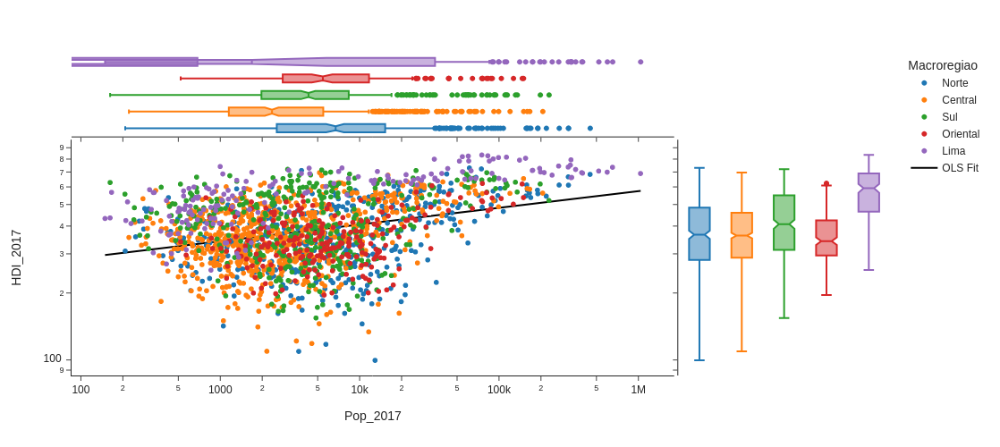

interactive(children=(Dropdown(description='x axis', index=9, options=('Code', 'State', 'City', 'Pop_2003', 'P…

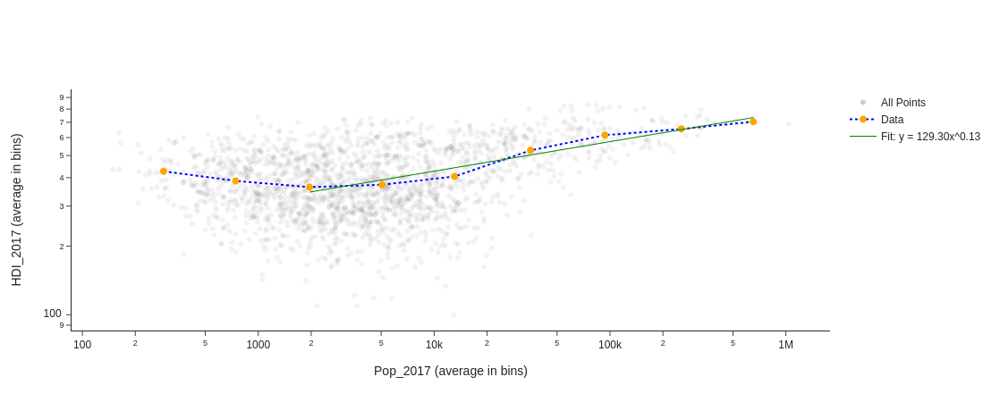

In [30]:
# import numpy as np
# import pandas as pd
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# from scipy.optimize import curve_fit
# import statsmodels.api as sm
# import plotly.express as px
# from ipywidgets import interact, widgets

# Function to separate data into linear 'bins'
def separate_bins_by_n_values(n, df, x_axis):
    min_value = df[x_axis].min()
    max_value = df[x_axis].max()
    return [min_value + i * (max_value - min_value) / n for i in range(n + 1)]

# Function to separate data into exponential 'bins'
def separate_bins_by_exponential(n, df, x_axis):
    bins = [df[x_axis].min()]
    for i in range(10*n):
        bins.append(bins[i] * (np.e**((i+1)/n) / np.e**(i/n)))
    return bins

# Linear function for curve fitting (in logarithmic scale)
def linear_func(x, a, b):
    return a * x + b

# Function to plot the graph based on 'bins' and perform curve fitting
def plot_df_bins(df_bins, df, x_axis, y_axis, height=500, width=1000):
    fig = make_subplots()
    
    # Adding scatter plot for all points
    fig.add_trace(go.Scatter(x=df[x_axis], y=df[y_axis], mode='markers', 
                             marker=dict(color='black', opacity=0.05),
                             name='All Points'))
    
    non_nan_x = ~np.isnan(df_bins[x_axis])
    non_nan_y = ~np.isnan(df_bins[y_axis])
    
    log_x = np.log(df_bins[x_axis][non_nan_x])
    log_y = np.log(df_bins[y_axis][non_nan_y])
    
    # Finding the index of the lowest y-axis value
    idx_min_y = np.argmin(log_y)
    
    # Using only points from the lowest value onwards for fitting
    log_x_adjusted = log_x[idx_min_y:]
    log_y_adjusted = log_y[idx_min_y:]
    
    # Performing curve fitting with adjusted points
    popt, pcov = curve_fit(linear_func, log_x_adjusted, log_y_adjusted)
    
    # Defining x and y values for the fitted line
    x_fit = np.linspace(log_x_adjusted.iloc[0], max(log_x_adjusted), 100)
    y_fit = linear_func(x_fit, *popt)

    # Incorporating equation into the legend
    C = np.exp(popt[1])
    equation_text = f"Fit: y = {C:.2f}x^{popt[0]:.2f}"
    
    fig.add_trace(go.Scatter(x=df_bins[x_axis][non_nan_x], y=df_bins[y_axis][non_nan_y], 
                             mode='markers+lines', name='Data', line=dict(color='blue', dash='dot', width=2), 
                             marker=dict(color='orange', size=8)))
    fig.add_trace(go.Scatter(x=np.exp(x_fit), y=np.exp(y_fit), mode='lines', 
                             name=equation_text, line=dict(color='green', width=1)))

        
    fig.update_yaxes(title_text=y_axis + ' (average in bins)', type="log")
    fig.update_xaxes(title_text=x_axis + " (average in bins)", type="log")
    fig.update_layout(template="simple_white", height=height, width=width)
    
    # Saving figures as SVG and PNG
#     fig.write_image("df_Peru_Bins.svg", scale=3)
#     fig.write_image("df_Peru_Bins.png", scale=3)
    fig.show()

# Main function to create and plot graphs based on 'bins'
def create_and_plot_bins_graphs(n, df, bin_separation_mode, x_axis, y_axis, height=500, width=1000):
    df_bins = create_bins_df(n, df, bin_separation_mode, x_axis, y_axis)
    plot_df_bins(df_bins, df, x_axis, y_axis, height, width)
    
# Function for interaction and visualization of data
def plot_interact(x_axis, y_axis, color, hovername, df, height=500, width=1000):
    fig = px.scatter(data_frame=df, x=x_axis, y=y_axis, marginal_x="box", marginal_y="box", 
                     template="simple_white", hover_name=hovername, log_x=True, log_y=True,
                     color=color, height=height, width=width)
    
    log_x = np.log(df[x_axis])
    log_y = np.log(df[y_axis])
    
    model = sm.OLS(log_y, sm.add_constant(log_x)).fit()
    predicted = model.predict(sm.add_constant(log_x))
    
    fig.add_trace(go.Scatter(x=df[x_axis], y=np.exp(predicted), mode='lines',
                             line=dict(color='black'), name="OLS Fit"))

    # Saving figures as SVG and PNG
#     fig.write_image("df_Peru_Dispersion.svg", scale=3)    
#     fig.write_image("df_Peru_Dispersion.png", scale=3)    
    fig.show()

# Wrapper function for interaction
def wrapper_plot_interact(x_axis, y_axis, color, hovername, height=500, width=1000):
    return plot_interact(x_axis, y_axis, color, hovername, df, height, width)

# Dropdown options
df = df_Peru
x_axis = widgets.Dropdown(options=df.columns, value='Pop_2017', description='x axis')
y_axis = widgets.Dropdown(options=df.columns, value='HDI_2017', description='y axis')
height = widgets.IntSlider(value=500, min=100, max=1500, step=10, description='Height')
width = widgets.IntSlider(value=1000, min=300, max=2000, step=10, description='Width')

# Interact function for visualization
interact(wrapper_plot_interact, x_axis=x_axis, y_axis=y_axis, color=['Macroregiao', 'Macroregioes_Topografica'], 
         hovername='City', height=height, width=width)

# Create and plot graphs based on exponential bins
create_and_plot_bins_graphs(n=1, df=df_Peru, bin_separation_mode='exponential', 
                              x_axis='Pop_2017', y_axis='HDI_2017', height=450, width=835)


# Base for Fig. 6: Comparison Countries, scatter plot x Binscatter Curve

Fig. 6: Comparison between the scatter plot and the corresponding numerical series
after the Binscatter process (Sec. 2.2). The countries analyzed include: Brazil, Chile,
Peru, Mexico, El Salvador, and the USA.

/tmp/ipykernel_266753/2597853208.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



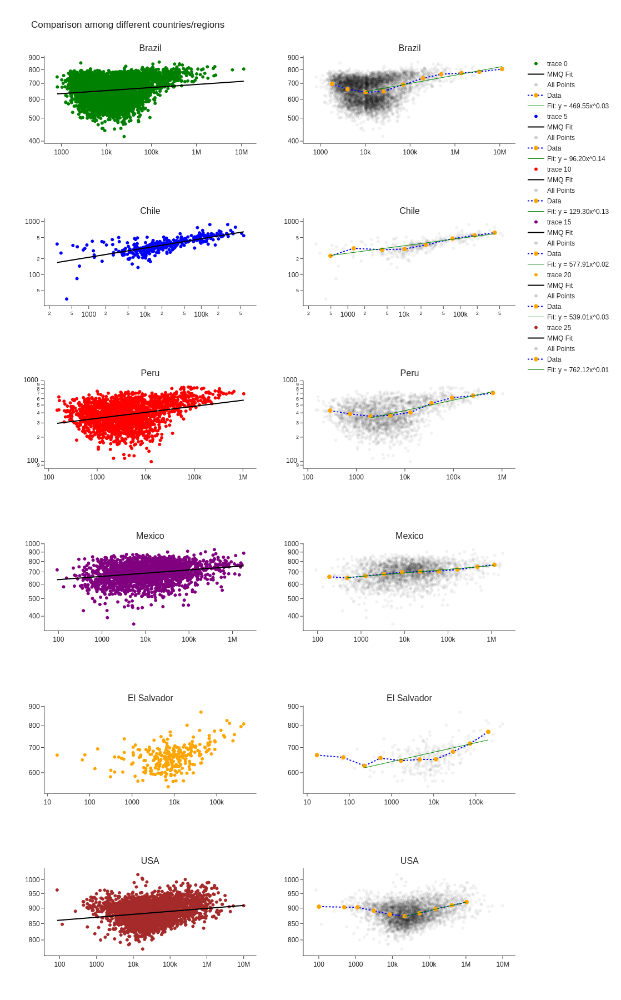

In [32]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# import numpy as np

# Preparing subplots:
fig = make_subplots(rows=6, cols=2, subplot_titles=[name for sublist in zip(datasets.keys(),
                                                                            datasets.keys()) for name in sublist])

colors_list = ['green', 'blue', 'red', 'purple', 'orange', 'brown']

row = 1
color_idx = 0

for name, data in datasets.items():
    # First Column (Code 2)
    scatter, line = generate_subplot(data['df'], data['x'], data['y'], data['hover'], colors_list[color_idx])
    fig.add_trace(scatter, row=row, col=1)
    fig.add_trace(line, row=row, col=1)

    # Second Column (Stored Code)
    df_bins = create_bins_df(1, data['df'], 'exponential', data['x'], data['y'])
    # Scatter for all points:
    scatter_all = go.Scatter(x=data['df'][data['x']], y=data['df'][data['y']], mode='markers', 
                             marker=dict(color='black', opacity=0.05), name='All Points')
    fig.add_trace(scatter_all, row=row, col=2)

    # Scatter for bin means:
    non_nan_x = ~np.isnan(df_bins[data['x']])
    non_nan_y = ~np.isnan(df_bins[data['y']])
    scatter_mean = go.Scatter(x=df_bins[data['x']][non_nan_x], y=df_bins[data['y']][non_nan_y], 
                              mode='markers+lines', name='Data', line=dict(color='blue', dash='dot', width=2),
                              marker=dict(color='orange', size=8))
    fig.add_trace(scatter_mean, row=row, col=2)

    # Fit line:
    log_x = np.log(df_bins[data['x']][non_nan_x])
    log_y = np.log(df_bins[data['y']][non_nan_y])
    idx_min_y = np.argmin(log_y)
    log_x_adjusted = log_x[idx_min_y:]
    log_y_adjusted = log_y[idx_min_y:]
    popt, _ = curve_fit(linear_func, log_x_adjusted, log_y_adjusted)
    x_fit = np.linspace(log_x_adjusted.iloc[0], max(log_x_adjusted), 100)
    y_fit = linear_func(x_fit, *popt)
    line_adjust = go.Scatter(x=np.exp(x_fit), y=np.exp(y_fit), mode='lines', 
                             line=dict(color='green', width=1), 
                             name=f"Fit: y = {np.exp(popt[1]):.2f}x^{popt[0]:.2f}")
    fig.add_trace(line_adjust, row=row, col=2)
    
    row += 1
    color_idx += 1

fig.update_layout(title_text="Comparison among different countries/regions", 
                  template="simple_white", width=1200, height=1800)
fig.update_xaxes(type="log"); fig.update_yaxes(type="log")
fig.show()

# # Saving figures as SVG and PNG
# fig.write_image("compare.svg")
# fig.write_image("compare.png", scale=3)


# Base for Fig. 7: Compare countries in same graphical

Fig. 7: Comparison of the numerical series generated by the bin division process (Sec.
2.2) of the respective scatter plots between HDI and population for the administrative
units of each country. In left: The bin division is adjusted for each country. In right:
using the same bin size for all countries.

/tmp/ipykernel_266753/2597853208.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



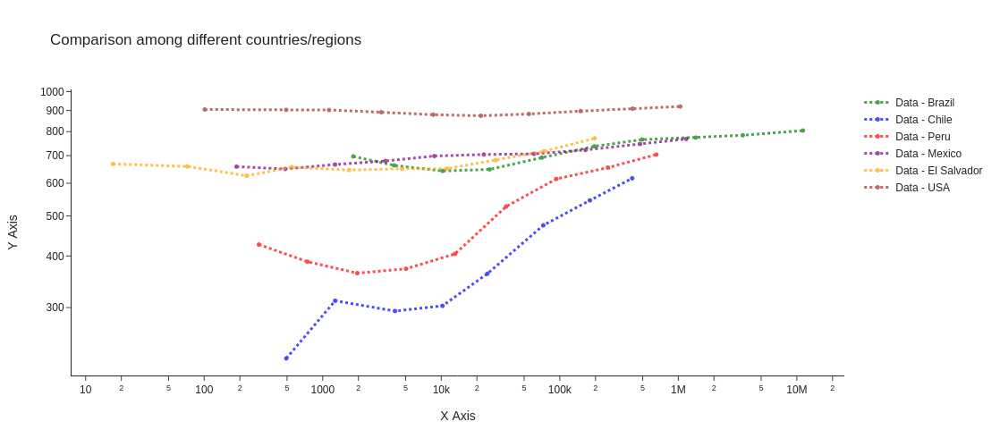

In [23]:
import plotly.graph_objects as go
import numpy as np

colors_list = ['green', 'blue', 'red', 'purple', 'orange', 'brown']

fig = go.Figure()

color_idx = 0

for name, data in datasets.items():
    # Preparing bins
    df_bins = create_bins_df(1, data['df'], 'exponential', data['x'], data['y'])
    
    non_nan_x = ~np.isnan(df_bins[data['x']])
    non_nan_y = ~np.isnan(df_bins[data['y']])
    scatter_mean = go.Scatter(x=df_bins[data['x']][non_nan_x], y=df_bins[data['y']][non_nan_y], 
                              mode='markers+lines', name=f'Data - {name}', 
                              line=dict(color=colors_list[color_idx], dash='dot', width=3),
                              marker=dict(color=colors_list[color_idx], size=5),
                              opacity=0.7)
    fig.add_trace(scatter_mean)

    color_idx += 1

fig.update_layout(title_text="Comparison among different countries/regions", 
                  template="simple_white", width=800, height=500)
fig.update_xaxes(type="log", title_text="X Axis")
fig.update_yaxes(type="log", title_text="Y Axis")
fig.show()

# Saving figures as SVG and PNG
# fig.write_image("combined_traces.svg")
# fig.write_image("combined_traces.png", scale=3)


### Creating Country Groups/Bins (Using the Same Pattern for All)

- The downside of this approach is that the bins are not optimized on a case-by-case basis. However, it's better for comparison purposes.
- The formula for generating the bins is: $ x_{n+1} = x_{n} * e^{n+1}/e^{n} = x_{n} * e $

In [22]:
# Defining the Groups
groups = [0, 2188.216871909531, 5948.190159639173 , 16168.85722316607, 43951.510776681105, 119472.59307757414, 
          324760.1787616517, 882789.692534909, 2399671.1795685906, 6522982.561698182, 17731304.964819398]

# Creating labels for the groups
labels = [f'Group_{i}' for i in range(1, len(groups))]

# Adding a new column to the DataFrame with group labels
df_ElSalvador['Population_Group'] = pd.cut(df_ElSalvador['Pop_total_2005'], bins=groups, labels=labels, right=False)
df_Chile['Population_Group'] = pd.cut(df_Chile['Población_2017'], bins=groups, labels=labels, right=False)
df_Mexico['Population_Group'] = pd.cut(df_Mexico['Pop_Total_2010'], bins=groups, labels=labels, right=False)
df_Peru['Population_Group'] = pd.cut(df_Peru['Pop_2017'], bins=groups, labels=labels, right=False)
df_USA_PerCounty['Population_Group'] = pd.cut(df_USA_PerCounty['2015_Tract_population'], bins=groups, labels=labels, right=False)
df_Brazil['Population_Group'] = pd.cut(df_Brazil['Total_Pop_Absol'], bins=groups, labels=labels, right=False)

# Grouping by 'Population_Group' and calculating the means
df_America_Countries_Bins = pd.DataFrame()
df_America_Countries_Bins["ElSalvador"] = df_ElSalvador.groupby('Population_Group')[['IDH_2005']].mean()
df_America_Countries_Bins["Chile"] = df_Chile.groupby('Population_Group')[['IDC_2020']].mean()
df_America_Countries_Bins["Mexico"] = df_Mexico.groupby('Population_Group')[['IDH_2000']].mean()
df_America_Countries_Bins["Peru"] = df_Peru.groupby('Population_Group')[['HDI_2017']].mean()
df_America_Countries_Bins["USA"] = df_USA_PerCounty.groupby('Population_Group')[['unadjusted_hdi']].mean()
df_America_Countries_Bins["Brazil"] = df_Brazil.groupby('Population_Group')[['IDHM_2010']].mean()
df_America_Countries_Bins['Population'] = groups[:-1]

# Visualizing the means
display(df_America_Countries_Bins)


/tmp/ipykernel_67502/1014556201.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ElSalvador,Chile,Mexico,Peru,USA,Brazil,Population
Population_Group,,,,,,,
Group_1,645.702703,281.038889,666.840361,380.434112,899.460510,696.897143,0.000000e+00
Group_2,652.824561,286.320000,681.197727,365.803731,889.162378,662.729355,2.188217e+03
Group_3,649.340659,306.616981,700.086538,389.571939,877.149432,642.610471,5.948190e+03
Group_4,678.640000,370.008333,703.191321,487.917647,876.847457,648.159496,1.616886e+04
Group_5,709.705882,476.435294,709.620253,591.615730,885.699725,692.100840,4.395151e+04
Group_6,771.857143,552.089474,724.402174,627.284848,895.232973,737.152778,1.194726e+05
Group_7,802.500000,632.800000,750.000000,710.318182,905.798014,765.500000,3.247602e+05
Group_8,NaN,NaN,771.666667,690.600000,915.341264,774.000000,8.827897e+05
Group_9,NaN,NaN,NaN,NaN,908.506170,784.000000,2.399671e+06


In [23]:
# import plotly.express as px
# import plotly.graph_objects as go

# Create a function to format the scale
def format_x_ticks(tick_value):
    if tick_value >= 1_000_000:
        return f"{tick_value / 1_000_000:.0f}M"
    elif tick_value >= 1_000:
        return f"{tick_value / 1_000:.0f}K"
    else:
        return str(tick_value)

# Create a line plot using Plotly Express
fig = px.line(df_America_Countries_Bins, x='Population', y=['Brazil', 'Chile', 'Peru', 'Mexico', 'ElSalvador', 'USA'],
              title='HDI Comparison by Population',
              labels={'value': 'HDI', 'Population': 'Population'},
              color_discrete_sequence=['green', 'blue', 'red', 'purple', 'orange', 'brown'],
              markers=True,  # Add markers
              line_shape='linear',  # Keep the line shape linear
              )

# Adjust the layout using Plotly Express
fig.update_layout(title_text="Comparison among different countries/regions", 
                  template="simple_white", width=800, height=500)
fig.update_xaxes(type="log", title_text="Population", tickvals=groups, 
                 ticktext=['0K', '2.2K', '5.95K', '16.2K', '43.95K', '119.5K', '324.8K','882.8K','2.4M','6.5M'],
                 tickformat=None, tickmode='array')  # Use specific tick values and labels
fig.update_yaxes(type="log", title_text="HDI")  # y-axis limit

# Add legends
fig.for_each_trace(lambda t: t.update(name=t.name.replace('_', ' ')))
fig.update_layout(legend_title_text='Countries')  # Change the legend title

# Change the lines to dotted
for trace in fig.data:
    trace.line.dash = 'dot'

# Display the plot
fig.show()

# Saving figures as SVG and PNG
# fig.write_image("Combined_traces_SameBins.svg")
# fig.write_image("Combined_traces_SameBins.png", scale=3)
